In [40]:
import pandas as pd
import numpy as np
import os
import struct
from scipy.io import wavfile as wav
import IPython.display as ipd
from IPython.display import Image
import librosa
import librosa.display
from librosa.display import waveplot, specshow
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
%matplotlib inline

In [41]:
import pandas as pd
meta_data=pd.read_csv('C:/Users/Anjali Rajagopal/Music/UrbanSound8K/metadata/UrbanSound8K.csv')
audio_dataset_path='UrbanSound8K/audio/'
print(meta_data.shape)
meta_data.head(10) 

(8732, 8)


,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
5,100263-2-0-143.wav,100263,71.500000,75.500000,1,5,2,children_playing
6,100263-2-0-161.wav,100263,80.500000,84.500000,1,5,2,children_playing
7,100263-2-0-3.wav,100263,1.500000,5.500000,1,5,2,children_playing
8,100263-2-0-36.wav,100263,18.000000,22.000000,1,5,2,children_playing
9,100648-1-0-0.wav,100648,4.823402,5.471927,2,10,1,car_horn


In [42]:
meta_data.isnull().sum()

slice_file_name    0
fsID               0
start              0
end                0
salience           0
fold               0
classID            0
class              0
dtype: int64

In [43]:
### Check whether the dataset is imbalanced
meta_data['class'].value_counts()

air_conditioner     1000
dog_bark            1000
jackhammer          1000
children_playing    1000
drilling            1000
street_music        1000
engine_idling       1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

The meta-data contains 8 columns.
slice_file_name: name of the audio file
fsID: FreesoundID of the recording where the excerpt is taken from
start: start time of the slice
end: end time of the slice
salience: salience rating of the sound. 1 = foreground, 2 = background
fold: The fold number (1-10) to which this file has been allocated
classID:
0 = air_conditioner
1 = car_horn
2 = children_playing
3 = dog_bark
4 = drilling
5 = engine_idling
6 = gun_shot
7 = jackhammer
8 = siren
9 = street_music
class: class name

In [44]:
classes = np.unique(meta_data['classID'])
classes_names = np.unique(meta_data['class'])
print(classes)
print(classes_names)

[0 1 2 3 4 5 6 7 8 9]
['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']


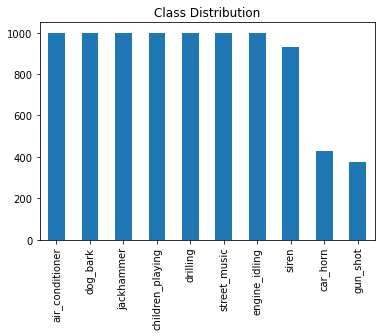

In [45]:
meta_data["class"].value_counts().plot(kind = 'bar')
plt.title('Class Distribution')
plt.show()

In [46]:
#Class Balancing
classid = []
print("Class balancing\n")
nclass = np.zeros(10)
for i in range(10):
  class_n = meta_data.loc[meta_data['classID'] == i]
  nclass[i] = class_n.shape[0]
  print("Class{num}".format(num=i),"has",class_n.shape[0], "samples", classes_names[i])

print("\n")

Class balancing

Class0 has 1000 samples air_conditioner
Class1 has 429 samples car_horn
Class2 has 1000 samples children_playing
Class3 has 1000 samples dog_bark
Class4 has 1000 samples drilling
Class5 has 1000 samples engine_idling
Class6 has 374 samples gun_shot
Class7 has 1000 samples jackhammer
Class8 has 929 samples siren
Class9 has 1000 samples street_music




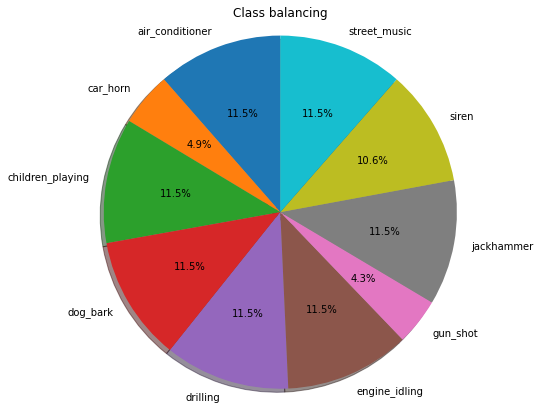

In [47]:
#Pie Chart On classes
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(7)
ax.pie(nclass, labels=classes_names, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax.axis('equal')  
ax.set(title='Class balancing')
plt.show()

count of datapoints in each of the folders

In [48]:
#Folder Balancing
nfolder = np.zeros(10)
print("Folder balancing\n")
for i in range(10):
  folder_n = meta_data.loc[meta_data['fold'] == i+1]
  nfolder[i] = folder_n.shape[0]
  print("Folder{num}".format(num=i+1),"has",folder_n.shape[0], "samples")

Folder balancing

Folder1 has 873 samples
Folder2 has 888 samples
Folder3 has 925 samples
Folder4 has 990 samples
Folder5 has 936 samples
Folder6 has 823 samples
Folder7 has 838 samples
Folder8 has 806 samples
Folder9 has 816 samples
Folder10 has 837 samples


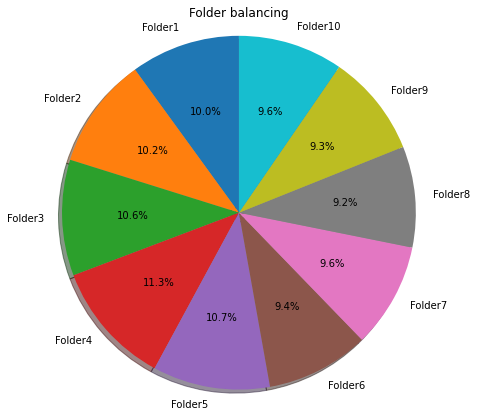

In [49]:
#Pie Chart on Folders
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(7)
folder_names = ["Folder{num}".format(num=i+1) for i in range(10)]
ax.pie(nfolder, labels=folder_names, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax.axis('equal')  
ax.set(title='Folder balancing')

plt.show()

# Different Sound Understanding

Dog_Bark

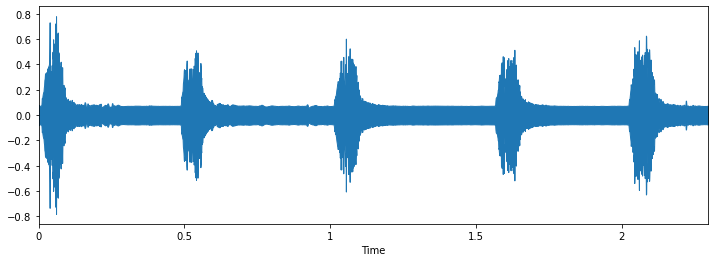

In [50]:
df="C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold1/9031-3-2-0.wav"
plt.figure(figsize=(12,4))
data,sample_rate=librosa.load(df)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(df)

Gun_shot

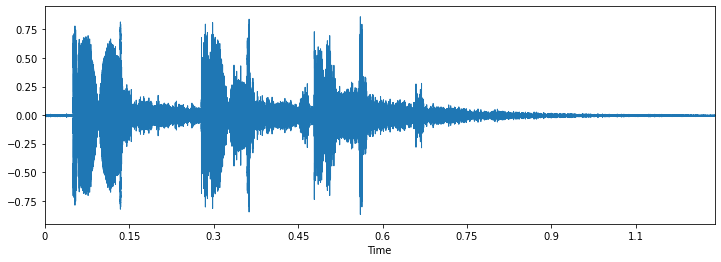

In [51]:
df1='C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold4/7064-6-3-0.WAV'
plt.figure(figsize=(12,4))
data1,sample_rate1=librosa.load(df1)
librosa.display.waveplot(data1,sr=sample_rate1)
ipd.Audio(df1)

Drilling

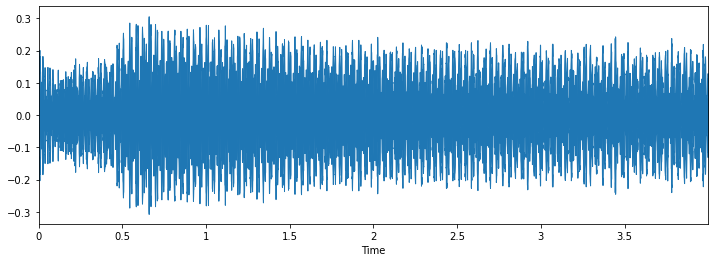

In [52]:
df2='C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold1/17592-5-1-0.wav'
plt.figure(figsize=(12,4))
data2,sample_rate2=librosa.load(df2)
librosa.display.waveplot(data2,sr=sample_rate2)
ipd.Audio(df2)

street_music

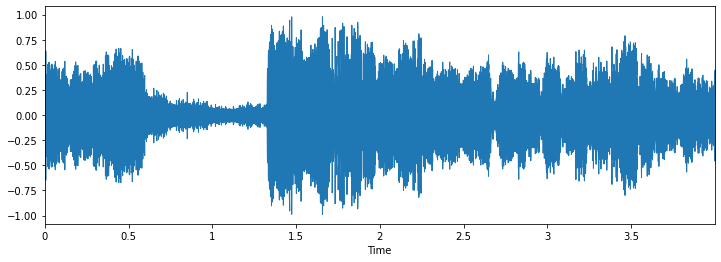

In [53]:
df3='C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold6/99710-9-0-6.wav'
plt.figure(figsize=(12,4))
data3,sample_rate3=librosa.load(df3)
librosa.display.waveplot(data3,sr=sample_rate3)
ipd.Audio(df3)

Car_Horn

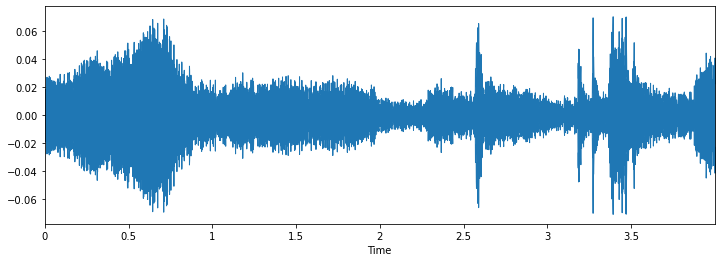

In [54]:
df4='C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold7/99812-1-0-1.wav'
plt.figure(figsize=(12,4))
data4,sample_rate4=librosa.load(df4)
librosa.display.waveplot(data4,sr=sample_rate4)
ipd.Audio(df4)

Children

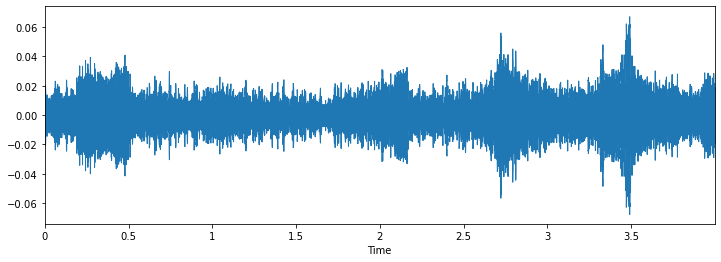

In [55]:
df5='C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold9/99500-2-0-23.wav'
plt.figure(figsize=(12,4))
data5,sample_rate5=librosa.load(df5)
librosa.display.waveplot(data5,sr=sample_rate5)
ipd.Audio(df5)

In [56]:
data_description = []
for i in range(1,11):
    data_description.append(meta_data[meta_data.fold == i]['class'].value_counts())
    
data_description = pd.DataFrame(data_description)
data_description['folder'] = ["fold"+str(x) for x in range(1,11)]
data_description.reset_index(inplace = True)
data_description

,index,jackhammer,drilling,children_playing,air_conditioner,street_music,dog_bark,engine_idling,siren,car_horn,gun_shot,folder
0,class,120,100,100,100,100,100,96,86,36,35,fold1
1,class,120,100,100,100,100,100,100,91,42,35,fold2
2,class,120,100,100,100,100,100,107,119,43,36,fold3
3,class,120,100,100,100,100,100,107,166,59,38,fold4
4,class,120,100,100,100,100,100,107,71,98,40,fold5
5,class,68,100,100,100,100,100,107,74,28,46,fold6
6,class,76,100,100,100,100,100,106,77,28,51,fold7
7,class,78,100,100,100,100,100,88,80,30,30,fold8
8,class,82,100,100,100,100,100,89,82,32,31,fold9
9,class,96,100,100,100,100,100,93,83,33,32,fold10


In [57]:
data = meta_data
def path_class(filename):
    excerpt = data[data['slice_file_name'] == filename]
    path_name = os.path.join('C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio', 'fold'+str(excerpt.fold.values[0]), filename)
    return path_name, excerpt['class'].values[0]
  
def wav_fmt_parser(file_name):
    full_path, _ = path_class(file_name)
    wave_file = open(full_path,"rb")
    riff_fmt = wave_file.read(36)
    n_channels_string = riff_fmt[22:24]
    n_channels = struct.unpack("H",n_channels_string)[0]
    s_rate_string = riff_fmt[24:28]
    s_rate = struct.unpack("I",s_rate_string)[0]
    bit_depth_string = riff_fmt[-2:]
    bit_depth = struct.unpack("H",bit_depth_string)[0]
    return (n_channels,s_rate,bit_depth)

In [58]:
wav_fmt_data = [wav_fmt_parser(i) for i in data.slice_file_name]
data[['n_channels','sampling_rate','bit_depth']] = pd.DataFrame(wav_fmt_data)
data.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,n_channels,sampling_rate,bit_depth
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,2,44100,16
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,2,44100,16
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,2,44100,16
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,2,44100,16
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,2,44100,16


In [59]:
print("sample rate  \n", data.sampling_rate.value_counts())
print("\n Number of channels \n", data.n_channels.value_counts())
print("\n Bit_depth \n", data.bit_depth.value_counts())

sample rate  
 44100     5370
48000     2502
96000      610
24000       82
16000       45
22050       44
11025       39
192000      17
8000        12
11024        7
32000        4
Name: sampling_rate, dtype: int64

 Number of channels 
 2    7993
1     739
Name: n_channels, dtype: int64

 Bit_depth 
 16    5758
24    2753
32     169
8       43
4        9
Name: bit_depth, dtype: int64


Here Librosa converts the signal to mono, meaning the channel will be 1

In [60]:
librosa_load, librosa_sampling_rate= librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold2/100652-3-0-1.wav')
scipy_sampling_rate, scipy_load = wav.read('C:/Users/Anjali Rajagopal/Music/UrbanSound8K/audio/fold2/100652-3-0-1.wav')
print('original wav file min - max range:',np.min(scipy_load),'-',np.max(scipy_load))
print('converted wav file min - max range:',np.min(librosa_load),'-',np.max(librosa_load))
print('\n')
print('original sample rate:',scipy_sampling_rate)
print('converted sample rate:',librosa_sampling_rate)

original wav file min - max range: -30926 - 30119
converted wav file min - max range: -0.7296108 - 0.74331266


original sample rate: 44100
converted sample rate: 22050


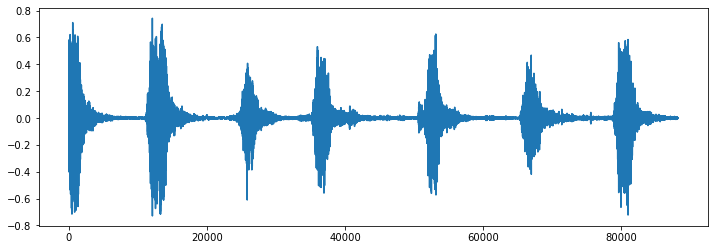

In [61]:
### Lets plot the librosa audio data
# Original audio with 1 channel 
plt.figure(figsize=(12, 4))
plt.plot(librosa_load)

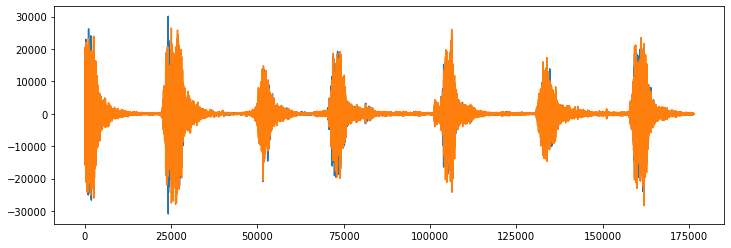

In [62]:
# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(scipy_load)

In [90]:
import pandas as pd
import numpy as np
import os
import struct
from scipy.io import wavfile as wav
import IPython.display as ipd
from IPython.display import Image
import librosa
import librosa.display
from librosa.display import waveplot, specshow
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
%matplotlib inline

def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/' + fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 1: Waveplot",x=0.5, y=0.915,fontsize=18)
    plt.show()
from matplotlib.colors import Normalize
def plot_mfcc(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(10,4))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        mfcc=librosa.feature.mfcc(np.array(f), sr=22050,n_mfcc=40)
        librosa.display.specshow(mfcc, x_axis='time',norm=Normalize(vmin=-30,vmax=30))
        plt.title(n.title())
        i += 1
    plt.show()
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 2: Spectrogram",x=0.5, y=0.915,fontsize=18)
    plt.show()


    
    


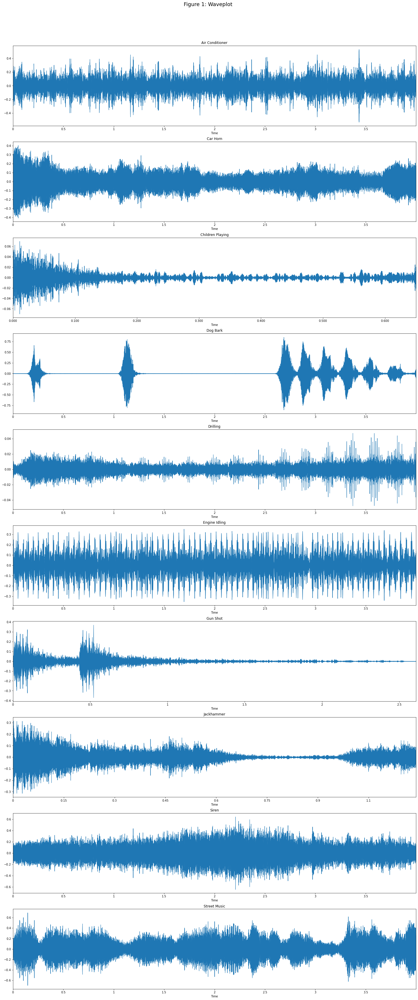

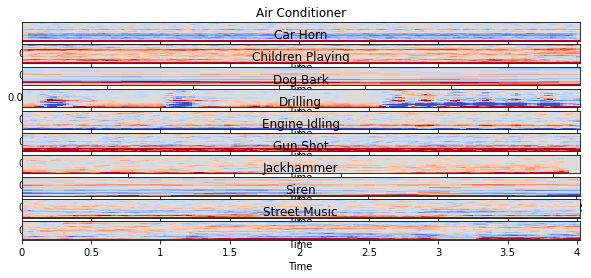

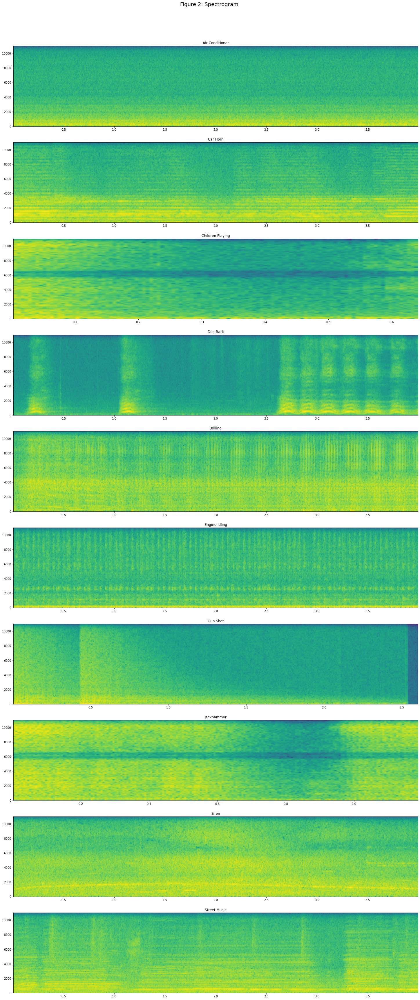

In [95]:
sound_file_paths = ["134717-0-0-0.wav","24074-1-0-3.wav","147764-4-2-0.wav","101415-3-0-2.wav",
"14113-4-0-0.wav","146186-5-0-10.wav","102305-6-0-0.wav",
"147764-4-7-0.wav","106905-8-0-0.wav","108041-9-0-2.wav"]

sound_names = ["air conditioner","car horn","children playing",
"dog bark","drilling","engine idling", "gun shot",
"jackhammer","siren","street music"]

raw_sounds = load_sound_files(sound_file_paths)
plot_waves(sound_names,raw_sounds)
plot_mfcc(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)

# chroma features

In [93]:
def plot_chromagram_stft(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        chr=librosa.feature.chroma_stft(np.array(f), sr=22050, hop_length= hop_length)
        librosa.display.specshow(chr, x_axis='time', y_axis='chroma', hop_length= hop_length, cmap='coolwarm')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: chromagram",x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_chromagram_cqt(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        chrq=librosa.feature.chroma_cqt(np.array(f), sr=22050, hop_length= hop_length)
        librosa.display.specshow(chrq, x_axis='time', y_axis='chroma', hop_length= hop_length, cmap='coolwarm')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: chromagram",x=0.5, y=0.915,fontsize=18)
    plt.show()
def plot_chromagram_cens(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        chrcn=librosa.feature.chroma_cens(np.array(f), sr=22050, hop_length= hop_length)
        librosa.display.specshow(chrcn, x_axis='time', y_axis='chroma', hop_length= hop_length, cmap='coolwarm')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: chromagram",x=0.5, y=0.915,fontsize=18)
    plt.show()



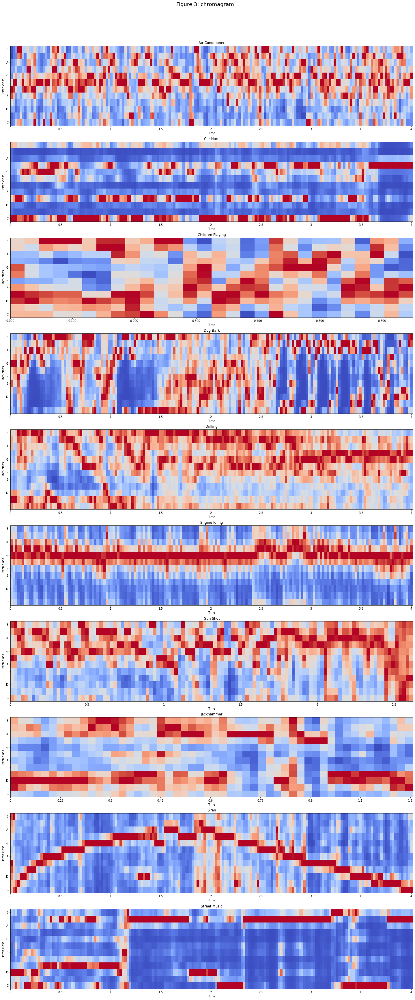

In [67]:
plot_chromagram_stft(sound_names,raw_sounds)

C:\Users\Anjali Rajagopal\anaconda3\lib\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=1024 is too small for input signal of length=896
  warnings.warn(
C:\Users\Anjali Rajagopal\anaconda3\lib\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=1024 is too small for input signal of length=448
  warnings.warn(
C:\Users\Anjali Rajagopal\anaconda3\lib\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=1024 is too small for input signal of length=224
  warnings.warn(
C:\Users\Anjali Rajagopal\anaconda3\lib\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=1024 is too small for input signal of length=900
  warnings.warn(
C:\Users\Anjali Rajagopal\anaconda3\lib\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=1024 is too small for input signal of length=820
  warnings.warn(
C:\Users\Anjali Rajagopal\anaconda3\lib\site-packages\librosa\core\spectrum.py:222: UserWarning: n_fft=1024 is too small for input signal of length=410
  w

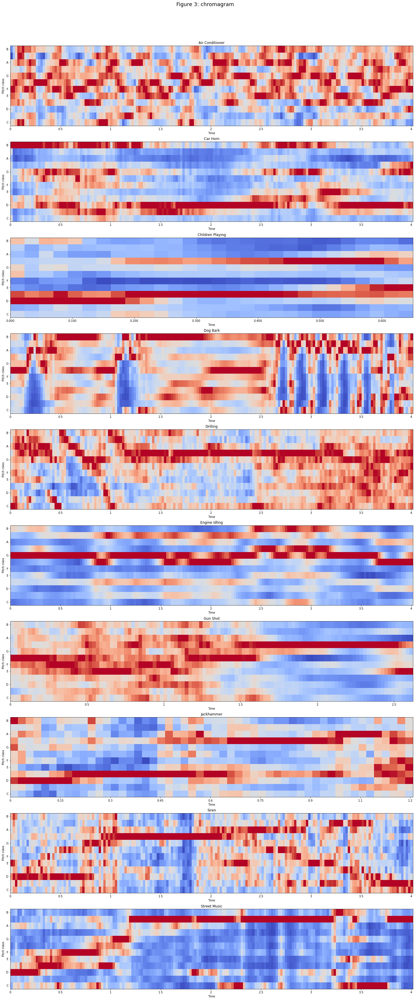

In [68]:
plot_chromagram_cqt(sound_names,raw_sounds)

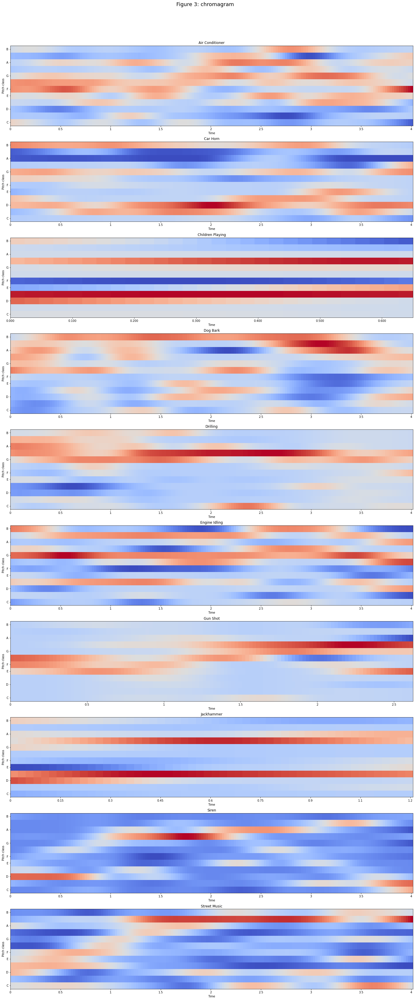

In [69]:
plot_chromagram_cens(sound_names,raw_sounds)

# Spectral features

# 1.spectral rolloff

Text(0.5, 0, 'street music')

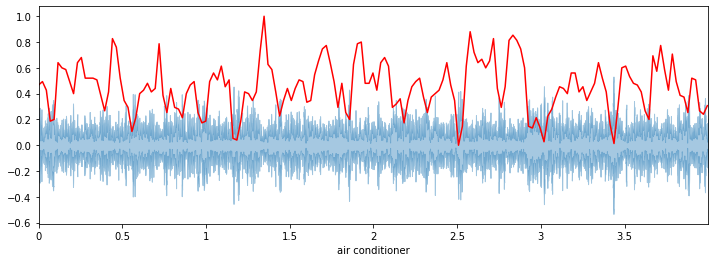

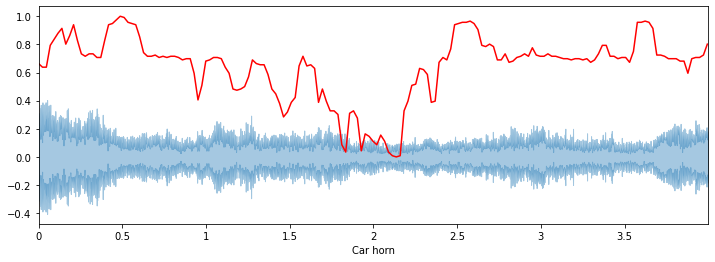

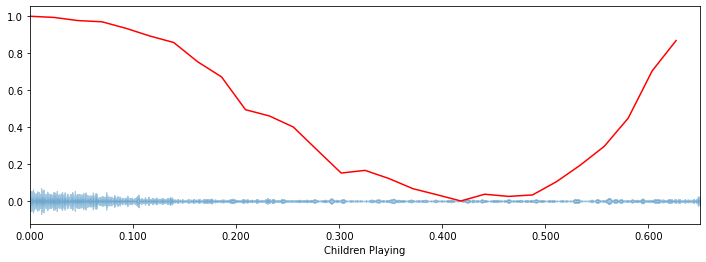

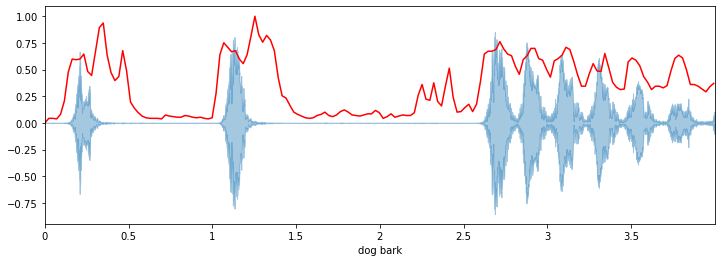

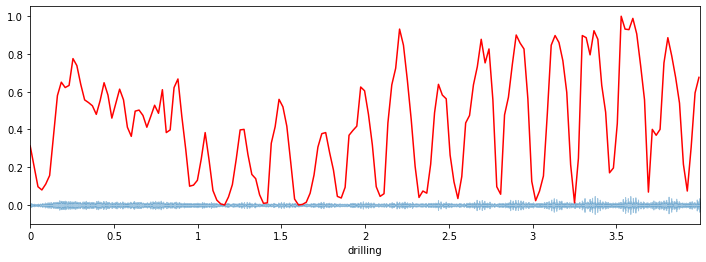

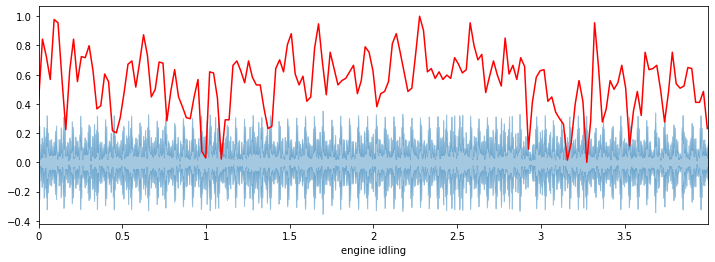

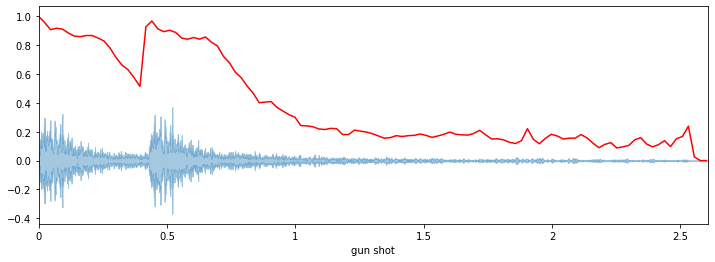

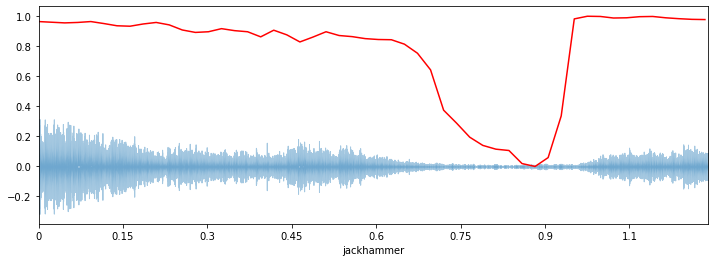

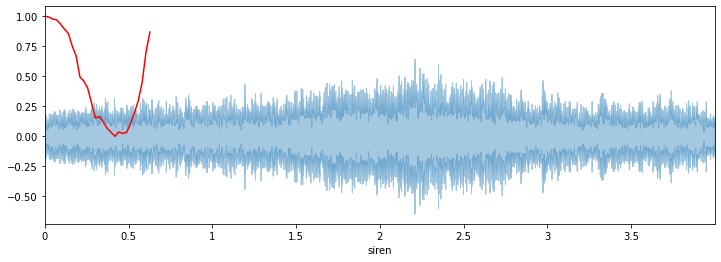

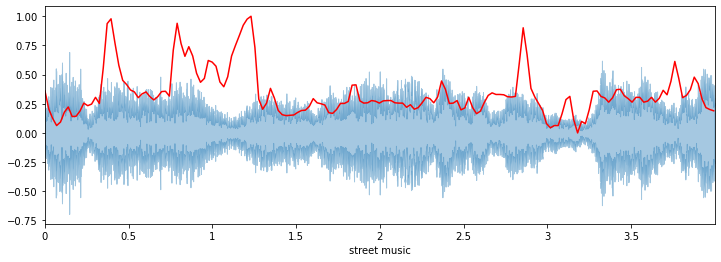

In [72]:

import sklearn
X1,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/134717-0-0-0.wav')
X2,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/24074-1-0-3.wav') 
X3,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-2-0.wav')
X4,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/101415-3-0-2.wav')
X5,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/14113-4-0-0.wav')
X6,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/146186-5-0-10.wav')
X7,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/102305-6-0-0.wav')
X8,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-7-0.wav')
X9,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/106905-8-0-0.wav')
X10,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/108041-9-0-2.wav')

spectral_rolloff1 = librosa.feature.spectral_rolloff(X1+0.01, sr=sr)[0]
frames1 = range(len(spectral_rolloff1))
t1 = librosa.frames_to_time(frames1)
def normalize(X1, axis=0):
    return sklearn.preprocessing.minmax_scale(X1, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X1, sr=sr, alpha=0.4)
plt.plot(t1, normalize(spectral_rolloff1), color='r')
plt.xlabel("air conditioner")

spectral_rolloff2 = librosa.feature.spectral_rolloff(X2+0.01, sr=sr)[0]
frames2 = range(len(spectral_rolloff2))
t2 = librosa.frames_to_time(frames2)
plt.figure(figsize=(12, 4))
def normalize(X2, axis=0):
    return sklearn.preprocessing.minmax_scale(X2, axis=axis)
librosa.display.waveplot(X2, sr=sr, alpha=0.4)
plt.plot(t2, normalize(spectral_rolloff2), color='r')
plt.xlabel("Car horn")

spectral_rolloff3 = librosa.feature.spectral_rolloff(X3+0.01, sr=sr)[0]
frames3 = range(len(spectral_rolloff3))
t3 = librosa.frames_to_time(frames3)
plt.figure(figsize=(12, 4))
def normalize(X3, axis=0):
    return sklearn.preprocessing.minmax_scale(X3, axis=axis)
librosa.display.waveplot(X3, sr=sr, alpha=0.4)
plt.plot(t3, normalize(spectral_rolloff3), color='r')
plt.xlabel("Children Playing")

spectral_rolloff4 = librosa.feature.spectral_rolloff(X4+0.01, sr=sr)[0]
frames4 = range(len(spectral_rolloff4))
t4 = librosa.frames_to_time(frames4)
plt.figure(figsize=(12, 4))
def normalize(X4, axis=0):
    return sklearn.preprocessing.minmax_scale(X4, axis=axis)
librosa.display.waveplot(X4, sr=sr, alpha=0.4)
plt.plot(t4, normalize(spectral_rolloff4), color='r')
plt.xlabel("dog bark")

spectral_rolloff5 = librosa.feature.spectral_rolloff(X5+0.01, sr=sr)[0]
frames5 = range(len(spectral_rolloff5))
t5 = librosa.frames_to_time(frames5)
plt.figure(figsize=(12, 4))
def normalize(X5, axis=0):
    return sklearn.preprocessing.minmax_scale(X5, axis=axis)
librosa.display.waveplot(X5, sr=sr, alpha=0.4)
plt.plot(t5, normalize(spectral_rolloff5), color='r')
plt.xlabel("drilling")

spectral_rolloff6 = librosa.feature.spectral_rolloff(X6+0.01, sr=sr)[0]
frames6 = range(len(spectral_rolloff6))
t6 = librosa.frames_to_time(frames6)
plt.figure(figsize=(12, 4))
def normalize(X6, axis=0):
    return sklearn.preprocessing.minmax_scale(X6, axis=axis)
librosa.display.waveplot(X6, sr=sr, alpha=0.4)
plt.plot(t6, normalize(spectral_rolloff6), color='r')
plt.xlabel("engine idling")

spectral_rolloff7 = librosa.feature.spectral_rolloff(X7+0.01, sr=sr)[0]
frames7 = range(len(spectral_rolloff7))
t7 = librosa.frames_to_time(frames7)
plt.figure(figsize=(12, 4))
def normalize(X7, axis=0):
    return sklearn.preprocessing.minmax_scale(X7, axis=axis)
librosa.display.waveplot(X7, sr=sr, alpha=0.4)
plt.plot(t7, normalize(spectral_rolloff7), color='r')
plt.xlabel("gun shot")

spectral_rolloff8 = librosa.feature.spectral_rolloff(X8+0.01, sr=sr)[0]
frames8 = range(len(spectral_rolloff8))
t8 = librosa.frames_to_time(frames8)
plt.figure(figsize=(12, 4))
def normalize(X8, axis=0):
    return sklearn.preprocessing.minmax_scale(X8, axis=axis)
librosa.display.waveplot(X8, sr=sr, alpha=0.4)
plt.plot(t8, normalize(spectral_rolloff8), color='r')
plt.xlabel("jackhammer")

spectral_rolloff9 = librosa.feature.spectral_rolloff(X3+0.01, sr=sr)[0]
frames9 = range(len(spectral_rolloff9))
t9 = librosa.frames_to_time(frames9)
plt.figure(figsize=(12, 4))
def normalize(X9, axis=0):
    return sklearn.preprocessing.minmax_scale(X9, axis=axis)
librosa.display.waveplot(X9, sr=sr, alpha=0.4)
plt.plot(t9, normalize(spectral_rolloff9), color='r')
plt.xlabel("siren")

spectral_rolloff10 = librosa.feature.spectral_rolloff(X10+0.01, sr=sr)[0]
frames10 = range(len(spectral_rolloff10))
t10 = librosa.frames_to_time(frames10)
plt.figure(figsize=(12, 4))
def normalize(X10, axis=0):
    return sklearn.preprocessing.minmax_scale(X10, axis=axis)
librosa.display.waveplot(X10, sr=sr, alpha=0.4)
plt.plot(t10, normalize(spectral_rolloff10), color='r')
plt.xlabel("street music")






    
    
    





# 2.spectral centroid

Text(0.5, 0, 'street music')

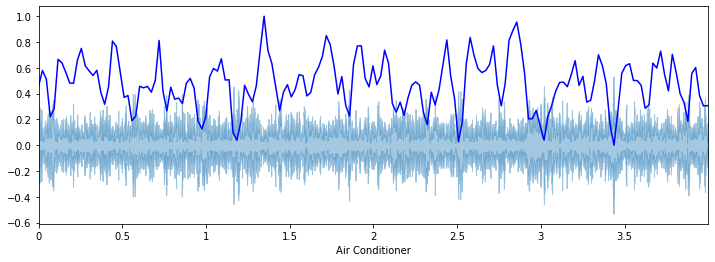

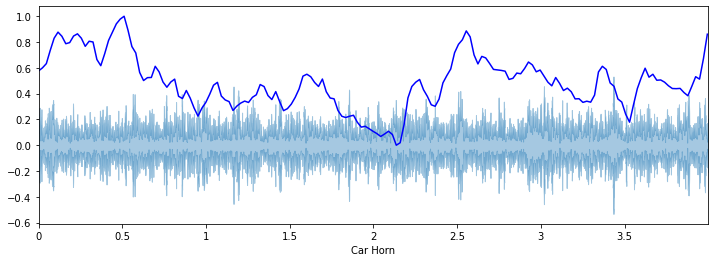

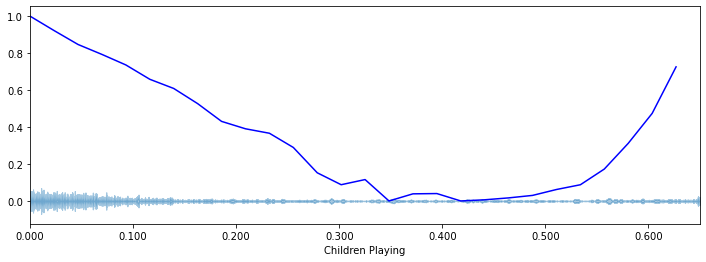

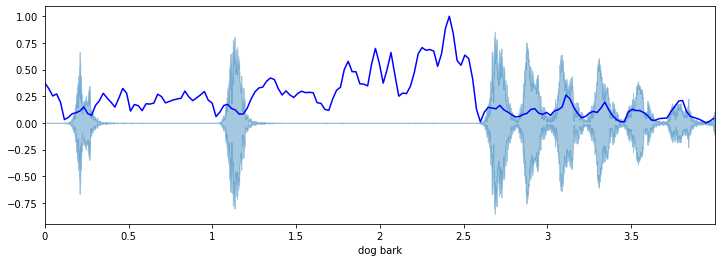

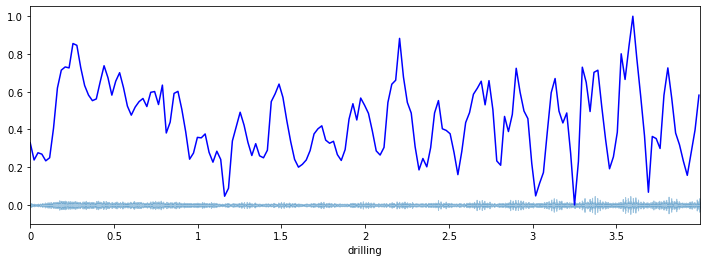

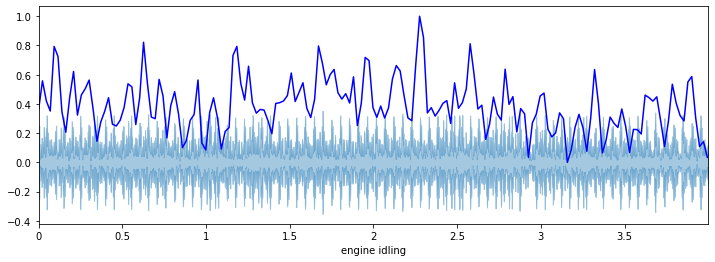

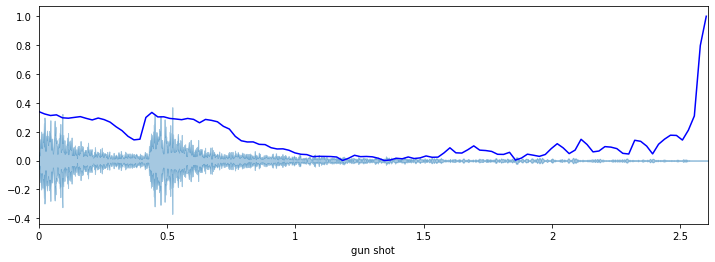

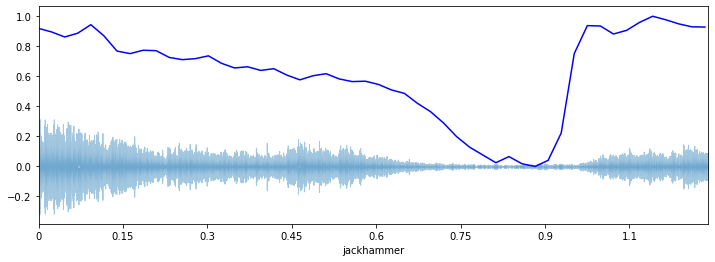

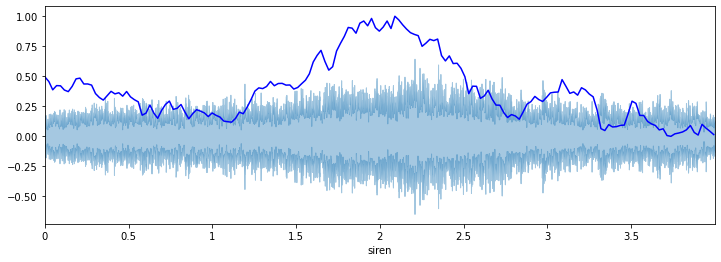

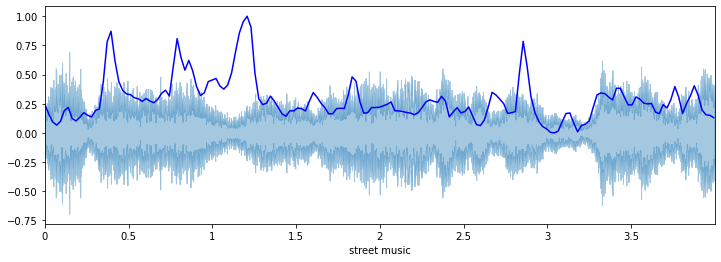

In [73]:
import sklearn
X1,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/134717-0-0-0.wav')
X2,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/24074-1-0-3.wav') 
X3,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-2-0.wav')
X4,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/101415-3-0-2.wav')
X5,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/14113-4-0-0.wav')
X6,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/146186-5-0-10.wav')
X7,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/102305-6-0-0.wav')
X8,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-7-0.wav')
X9,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/106905-8-0-0.wav')
X10,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/108041-9-0-2.wav')

spectral_centroid1 = librosa.feature.spectral_centroid(X1, sr=sr)[0]
frames1 = range(len(spectral_centroid1))
t1 = librosa.frames_to_time(frames1)
def normalize(X1, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X1, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X1, sr=sr, alpha=0.4)
plt.plot(t1, normalize(spectral_centroid1), color='b')
plt.xlabel("Air Conditioner")


spectral_centroid2 = librosa.feature.spectral_centroid(X2, sr=sr)[0]
frames2 = range(len(spectral_centroid2))
t2 = librosa.frames_to_time(frames2)
def normalize(X2, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X2, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X1, sr=sr, alpha=0.4)
plt.plot(t2, normalize(spectral_centroid2), color='b')
plt.xlabel("Car Horn")

spectral_centroid3 = librosa.feature.spectral_centroid(X3, sr=sr)[0]
frames3 = range(len(spectral_centroid3))
t3 = librosa.frames_to_time(frames3)
def normalize(X3, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X3, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X3, sr=sr, alpha=0.4)
plt.plot(t3, normalize(spectral_centroid3), color='b')
plt.xlabel("Children Playing")

spectral_centroid4 = librosa.feature.spectral_centroid(X4, sr=sr)[0]
frames4 = range(len(spectral_centroid4))
t4 = librosa.frames_to_time(frames4)
def normalize(X4, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X4, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X4, sr=sr, alpha=0.4)
plt.plot(t4, normalize(spectral_centroid4), color='b')
plt.xlabel("dog bark")

spectral_centroid5 = librosa.feature.spectral_centroid(X5, sr=sr)[0]
frames5 = range(len(spectral_centroid5))
t5 = librosa.frames_to_time(frames5)
def normalize(X5, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X5, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X5, sr=sr, alpha=0.4)
plt.plot(t5, normalize(spectral_centroid5), color='b')
plt.xlabel("drilling")

spectral_centroid6 = librosa.feature.spectral_centroid(X6, sr=sr)[0]
frames6 = range(len(spectral_centroid6))
t6 = librosa.frames_to_time(frames6)
def normalize(X6, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X6, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X6, sr=sr, alpha=0.4)
plt.plot(t6, normalize(spectral_centroid6), color='b')
plt.xlabel("engine idling")

spectral_centroid7 = librosa.feature.spectral_centroid(X7, sr=sr)[0]
frames7 = range(len(spectral_centroid7))
t7 = librosa.frames_to_time(frames7)
def normalize(X7, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X7, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X7, sr=sr, alpha=0.4)
plt.plot(t7, normalize(spectral_centroid7), color='b')
plt.xlabel("gun shot")

spectral_centroid8 = librosa.feature.spectral_centroid(X8, sr=sr)[0]
frames8 = range(len(spectral_centroid8))
t8 = librosa.frames_to_time(frames8)
def normalize(X8, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X8, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X8, sr=sr, alpha=0.4)
plt.plot(t8, normalize(spectral_centroid8), color='b')
plt.xlabel("jackhammer")

spectral_centroid9 = librosa.feature.spectral_centroid(X9, sr=sr)[0]
frames9 = range(len(spectral_centroid9))
t9 = librosa.frames_to_time(frames9)
def normalize(X9, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X9, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X9, sr=sr, alpha=0.4)
plt.plot(t9, normalize(spectral_centroid9), color='b')
plt.xlabel("siren")

spectral_centroid10 = librosa.feature.spectral_centroid(X10, sr=sr)[0]
frames10 = range(len(spectral_centroid9))
t10 = librosa.frames_to_time(frames10)
def normalize(X10, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X10, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X10, sr=sr, alpha=0.4)
plt.plot(t10, normalize(spectral_centroid10), color='b')
plt.xlabel("street music")



# 3. Zero crossing rate

zc of air conditioner audio is 4
zc of Car Horn audio is 15
zc of children playing audio is 9
zc of dog bark audio is 4
zc of drilling is 35
zc of engine idling is 23
zc of gunshot is 9
zc of Jack Hammer is 43
zc of Siren is 16
zc of Street Music is 23


<Figure size 1008x360 with 0 Axes>

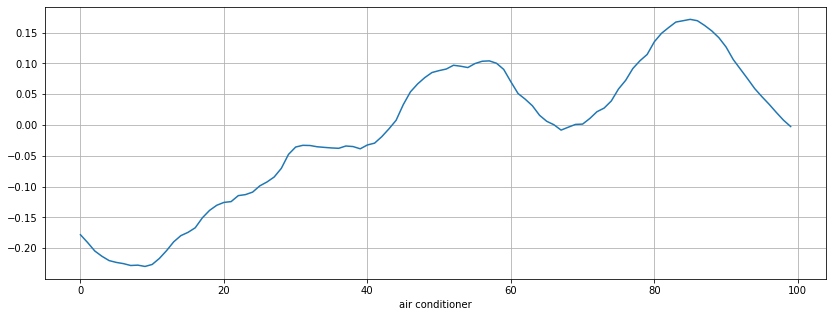

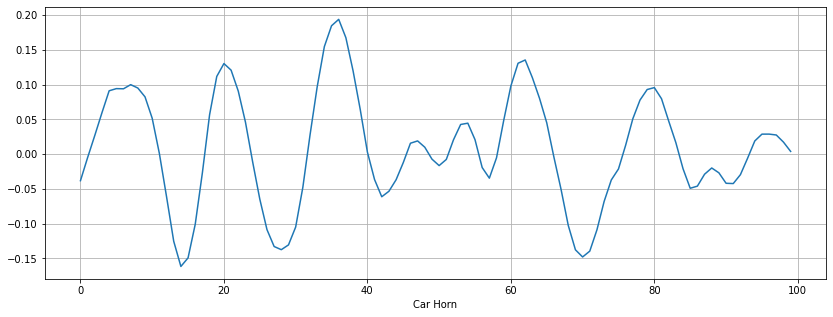

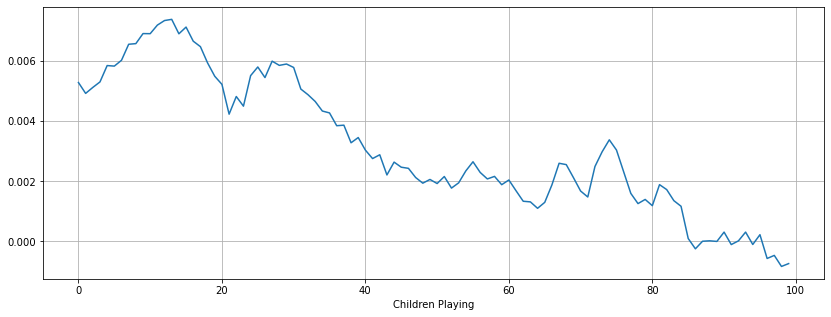

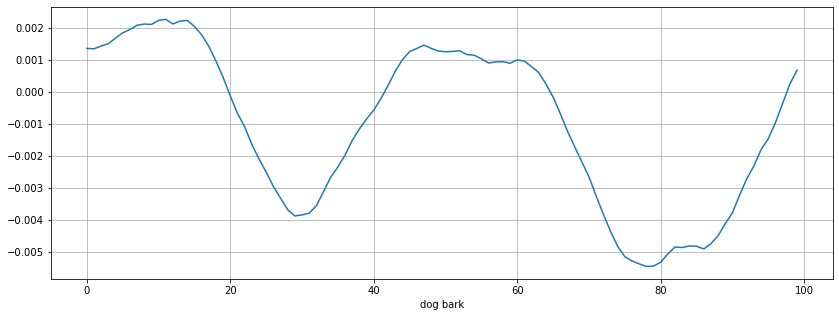

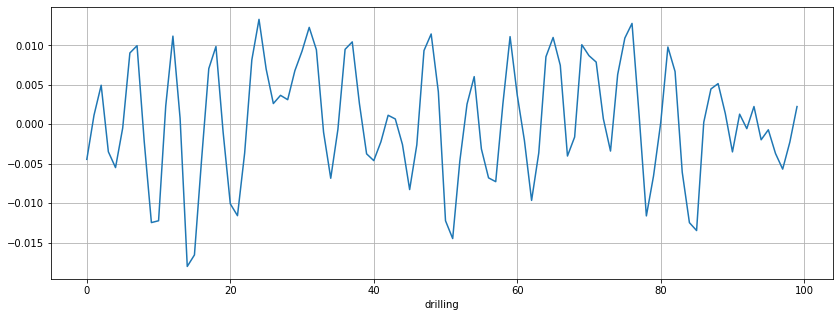

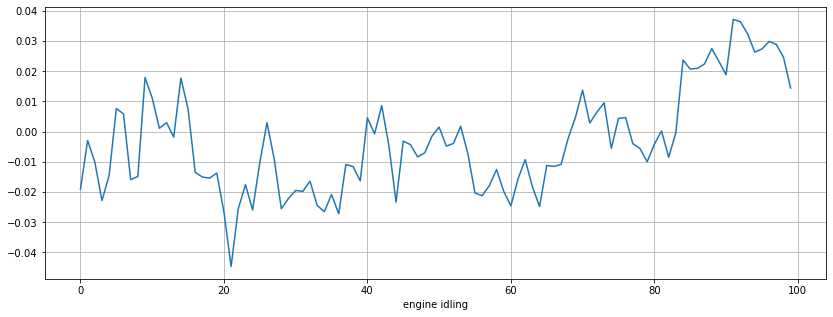

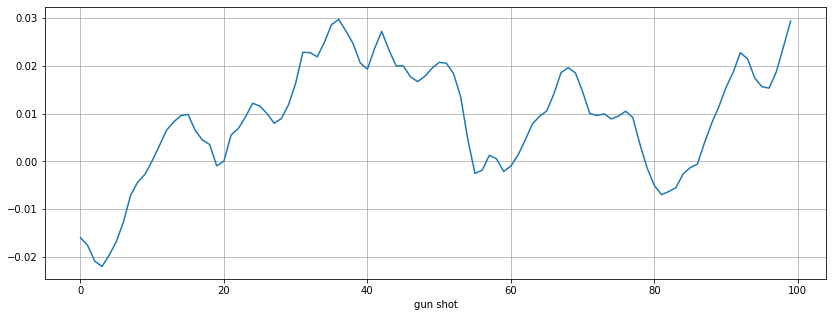

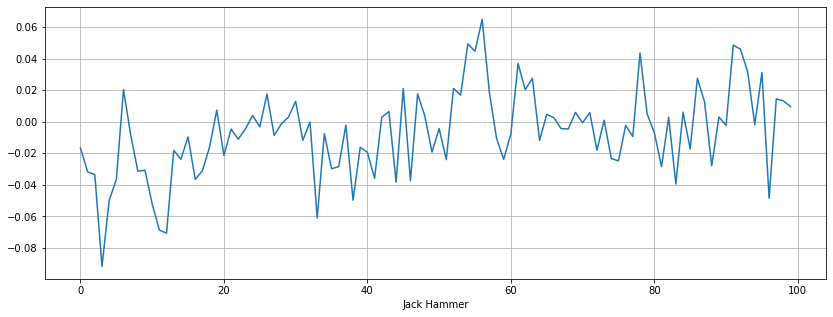

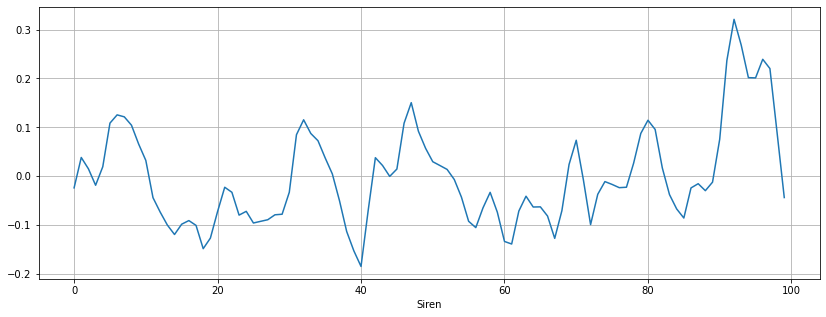

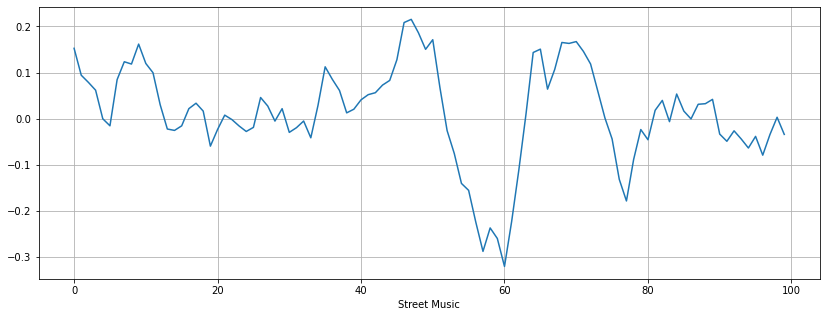

In [74]:
import sklearn
X1,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/134717-0-0-0.wav')
X2,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/24074-1-0-3.wav') 
X3,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-2-0.wav')
X4,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/101415-3-0-2.wav')
X5,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/14113-4-0-0.wav')
X6,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/146186-5-0-10.wav')
X7,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/102305-6-0-0.wav')
X8,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-7-0.wav')
X9,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/106905-8-0-0.wav')
X10,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/108041-9-0-2.wav')
plt.figure(figsize=(14, 5))
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(X1[n0:n1])
plt.xlabel("air conditioner")
plt.grid()

zero_crossings1 = librosa.zero_crossings(X1[n0:n1], pad=False)
print("zc of air conditioner audio is", sum(zero_crossings1))

plt.figure(figsize=(14, 5))
plt.plot(X2[n0:n1])
plt.xlabel("Car Horn")
plt.grid()
zero_crossings2 = librosa.zero_crossings(X2[n0:n1], pad=False)
print("zc of Car Horn audio is", sum(zero_crossings2))

plt.figure(figsize=(14, 5))
plt.plot(X3[n0:n1])
plt.xlabel("Children Playing")
plt.grid()
zero_crossings3 = librosa.zero_crossings(X3[n0:n1], pad=False)
print("zc of children playing audio is", sum(zero_crossings3))

plt.figure(figsize=(14, 5))
plt.plot(X4[n0:n1])
plt.xlabel("dog bark")
plt.grid()
zero_crossings4 = librosa.zero_crossings(X4[n0:n1], pad=False)
print("zc of dog bark audio is", sum(zero_crossings4))

plt.figure(figsize=(14, 5))
plt.plot(X5[n0:n1])
plt.xlabel("drilling")
plt.grid()
zero_crossings5 = librosa.zero_crossings(X5[n0:n1], pad=False)
print("zc of drilling is", sum(zero_crossings5))

plt.figure(figsize=(14, 5))
plt.plot(X6[n0:n1])
plt.xlabel("engine idling")
plt.grid()
zero_crossings6 = librosa.zero_crossings(X6[n0:n1], pad=False)
print("zc of engine idling is", sum(zero_crossings6))

plt.figure(figsize=(14, 5))
plt.plot(X7[n0:n1])
plt.xlabel("gun shot")
plt.grid()
zero_crossings7 = librosa.zero_crossings(X7[n0:n1], pad=False)
print("zc of gunshot is", sum(zero_crossings7))

plt.figure(figsize=(14, 5))
plt.plot(X8[n0:n1])
plt.xlabel("Jack Hammer")
plt.grid()
zero_crossings8 = librosa.zero_crossings(X8[n0:n1], pad=False)
print("zc of Jack Hammer is", sum(zero_crossings8))

plt.figure(figsize=(14, 5))
plt.plot(X9[n0:n1])
plt.xlabel("Siren")
plt.grid()
zero_crossings9 = librosa.zero_crossings(X9[n0:n1], pad=False)
print("zc of Siren is", sum(zero_crossings9))

plt.figure(figsize=(14, 5))
plt.plot(X10[n0:n1])
plt.xlabel("Street Music")
plt.grid()
zero_crossings10 = librosa.zero_crossings(X10[n0:n1], pad=False)
print("zc of Street Music is", sum(zero_crossings10))










# 4.Root mean square

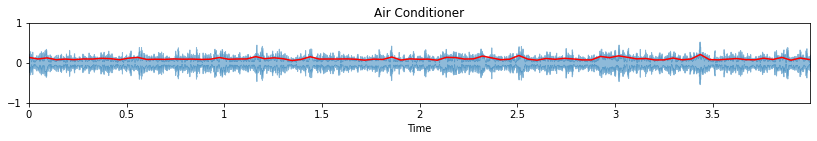

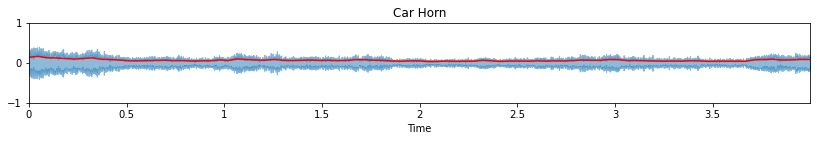

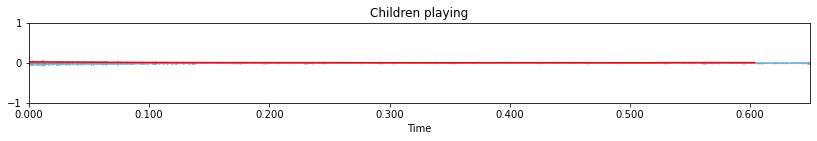

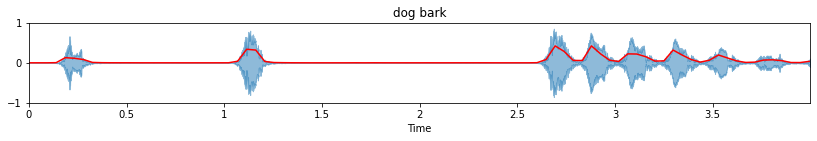

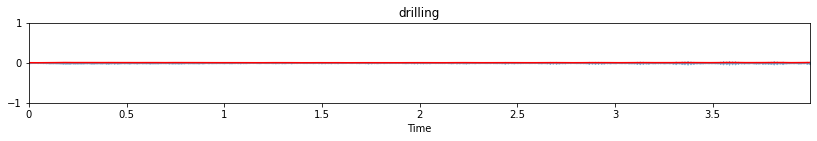

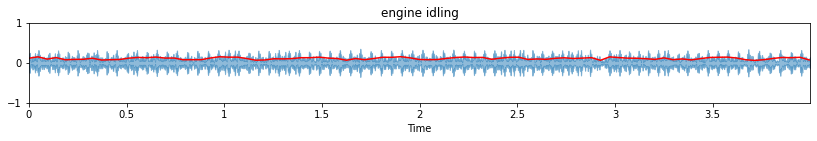

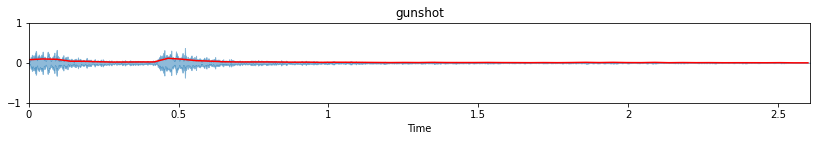

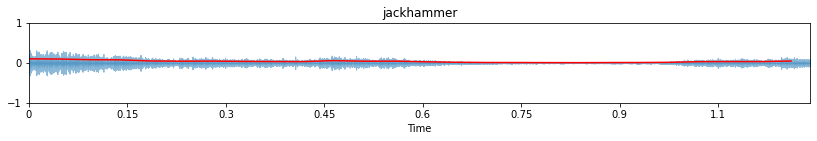

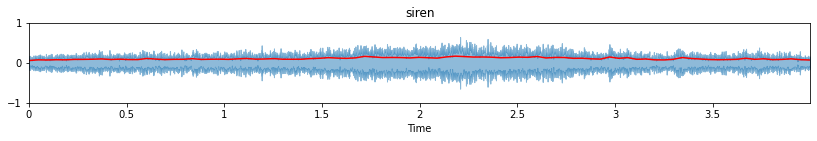

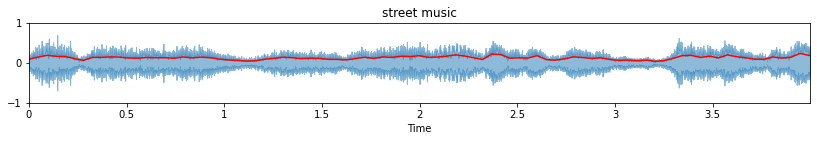

In [75]:
import sklearn
X1,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/134717-0-0-0.wav')
X2,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/24074-1-0-3.wav') 
X3,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-2-0.wav')
X4,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/101415-3-0-2.wav')
X5,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/14113-4-0-0.wav')
X6,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/146186-5-0-10.wav')
X7,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/102305-6-0-0.wav')
X8,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/147764-4-7-0.wav')
X9,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/106905-8-0-0.wav')
X10,sr = librosa.load('C:/Users/Anjali Rajagopal/Music/UrbanSound8k/audio/fold1/108041-9-0-2.wav')

HOP_LENGTH=1024
FRAME_SIZE=512
rms1 = librosa.feature.rms(X1,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames1 = range(len(rms1))
t1 = librosa.frames_to_time(frames1,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X1, alpha=0.5)
plt.plot(t1,rms1, color='r')
plt.ylim((-1, 1))
plt.title("Air Conditioner")

rms2 = librosa.feature.rms(X2,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames2 = range(len(rms2))
t2 = librosa.frames_to_time(frames2,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X2, alpha=0.5)
plt.plot(t2,rms2, color='r')
plt.ylim((-1, 1))
plt.title("Car Horn")

rms3 = librosa.feature.rms(X3,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames3 = range(len(rms3))
t3 = librosa.frames_to_time(frames3,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X3, alpha=0.5)
plt.plot(t3,rms3, color='r')
plt.ylim((-1, 1))
plt.title("Children playing")

rms4 = librosa.feature.rms(X4,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames4 = range(len(rms4))
t4 = librosa.frames_to_time(frames4,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X4, alpha=0.5)
plt.plot(t4,rms4, color='r')
plt.ylim((-1, 1))
plt.title("dog bark")

rms5 = librosa.feature.rms(X5,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames5 = range(len(rms5))
t5 = librosa.frames_to_time(frames5,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X5, alpha=0.5)
plt.plot(t5,rms5, color='r')
plt.ylim((-1, 1))
plt.title("drilling")

rms6 = librosa.feature.rms(X6,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames6 = range(len(rms6))
t6 = librosa.frames_to_time(frames6,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X6, alpha=0.5)
plt.plot(t6,rms6, color='r')
plt.ylim((-1, 1))
plt.title("engine idling")

rms7 = librosa.feature.rms(X7,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames7 = range(len(rms7))
t7 = librosa.frames_to_time(frames7,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X7, alpha=0.5)
plt.plot(t7,rms7, color='r')
plt.ylim((-1, 1))
plt.title("gunshot")

rms8 = librosa.feature.rms(X8,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames8 = range(len(rms8))
t8 = librosa.frames_to_time(frames8,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X8, alpha=0.5)
plt.plot(t8,rms8, color='r')
plt.ylim((-1, 1))
plt.title("jackhammer")

rms9 = librosa.feature.rms(X9,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames9 = range(len(rms9))
t9 = librosa.frames_to_time(frames9,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X9, alpha=0.5)
plt.plot(t9,rms9, color='r')
plt.ylim((-1, 1))
plt.title("siren")

rms10 = librosa.feature.rms(X10,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames10 = range(len(rms10))
t10 = librosa.frames_to_time(frames10,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(X10, alpha=0.5)
plt.plot(t10,rms10, color='r')
plt.ylim((-1, 1))
plt.title("street music")


sound_names = ["air conditioner","car horn","children playing",
"dog bark","drilling","engine idling", "gun shot",
"jackhammer","siren","street music"]


##  5 Spectral_Bandwith

In [76]:
## Loading data for Spectral_Bandwith
x1, sr = librosa.load(df)
x2, sr = librosa.load(df1)
x3, sr = librosa.load(df2)
x4, sr = librosa.load(df3)
x5, sr = librosa.load(df4)
x6, sr = librosa.load(df5)

Text(0.5, 0, 'Children')

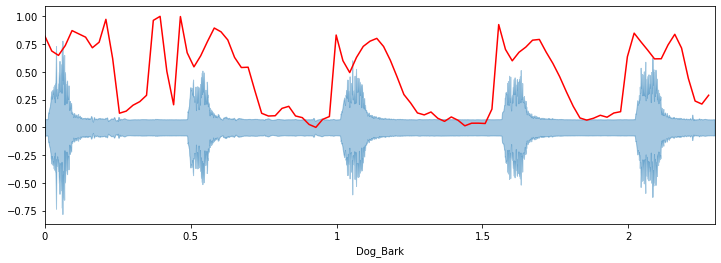

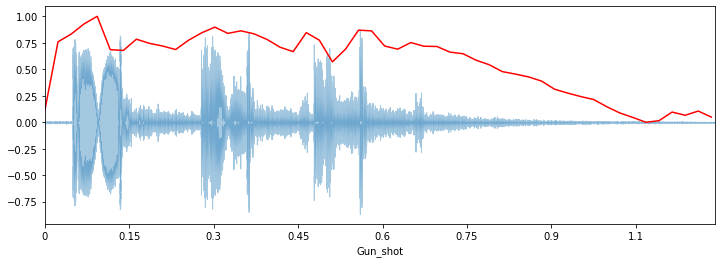

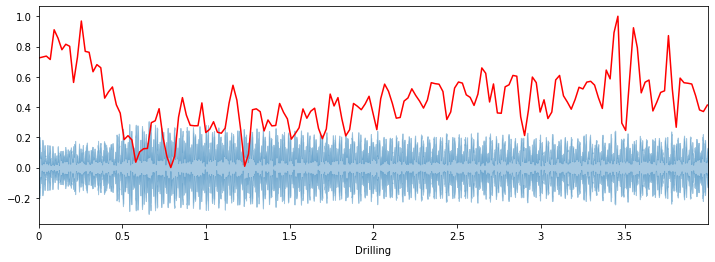

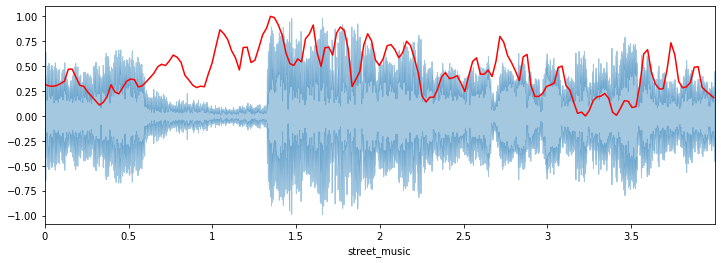

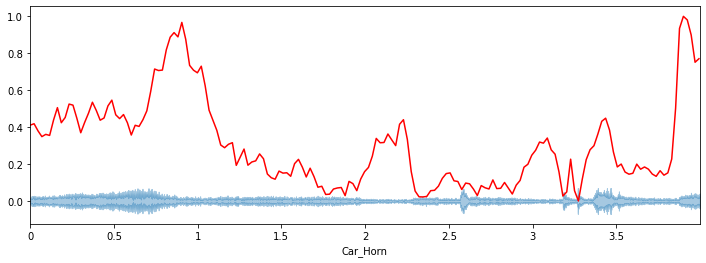

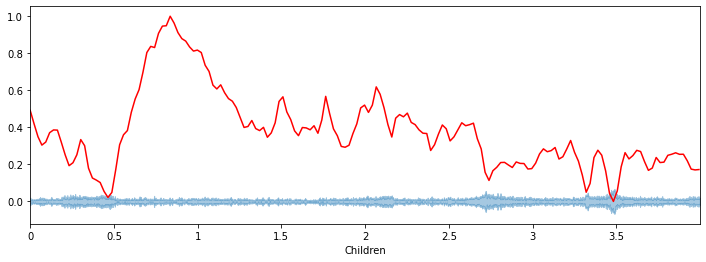

In [77]:
spectral_bandwith1 = librosa.feature.spectral_bandwidth(x1, sr=sr)[0]
frames1 = range(len(spectral_bandwith1))
t1 = librosa.frames_to_time(frames1)
def normalize(x1, axis=0):
    return sklearn.preprocessing.minmax_scale(x1, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveplot(x1, sr=sr, alpha=0.4)
plt.plot(t1, normalize(spectral_bandwith1), color='r')
plt.xlabel("Dog_Bark")

spectral_bandwith2 = librosa.feature.spectral_bandwidth(x2, sr=sr)[0]
frames2 = range(len(spectral_bandwith2))
t2 = librosa.frames_to_time(frames2)
def normalize(x2, axis=0):
    return sklearn.preprocessing.minmax_scale(x2, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveplot(x2, sr=sr, alpha=0.4)
plt.plot(t2, normalize(spectral_bandwith2), color='r')
plt.xlabel("Gun_shot")

spectral_bandwith3 = librosa.feature.spectral_bandwidth(x3, sr=sr)[0]
frames3 = range(len(spectral_bandwith3))
t3 = librosa.frames_to_time(frames3)
def normalize(x3, axis=0):
    return sklearn.preprocessing.minmax_scale(x3, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveplot(x3, sr=sr, alpha=0.4)
plt.plot(t3, normalize(spectral_bandwith3), color='r')
plt.xlabel("Drilling")

spectral_bandwith4 = librosa.feature.spectral_bandwidth(x4, sr=sr)[0]
frames4 = range(len(spectral_bandwith4))
t4 = librosa.frames_to_time(frames4)
def normalize(x4, axis=0):
    return sklearn.preprocessing.minmax_scale(x4, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveplot(x4, sr=sr, alpha=0.4)
plt.plot(t4, normalize(spectral_bandwith4), color='r')
plt.xlabel("street_music")

spectral_bandwith5 = librosa.feature.spectral_bandwidth(x5, sr=sr)[0]
frames5 = range(len(spectral_bandwith5))
t5 = librosa.frames_to_time(frames5)
def normalize(x5, axis=0):
    return sklearn.preprocessing.minmax_scale(x5, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveplot(x5, sr=sr, alpha=0.4)
plt.plot(t5, normalize(spectral_bandwith5), color='r')
plt.xlabel("Car_Horn")

spectral_bandwith6 = librosa.feature.spectral_bandwidth(x6, sr=sr)[0]
frames6 = range(len(spectral_bandwith6))
t6 = librosa.frames_to_time(frames6)
def normalize(x6, axis=0):
    return sklearn.preprocessing.minmax_scale(x6, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveplot(x6, sr=sr, alpha=0.4)
plt.plot(t6, normalize(spectral_bandwith6), color='r')
plt.xlabel("Children")